# Seizure prediction
Try to setup code to sample data before a seizure occurs and see if i can't generalize to a class for later analysis

In [1]:
import sys, os
sys.path.append(os.path.realpath(".."))

import util_funcs
from importlib import reload
reload(util_funcs)
from copy import deepcopy as cp

import data_reader as read
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import pywt
import tsfresh.feature_extraction.feature_calculators as feats
import constants
import clinical_text_analysis as cta
reload(cta)
import tsfresh
import ensembleReader as er
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, roc_curve, r2_score
from os import path

reload(read)
import wf_analysis.datasets as wfdata
import wf_analysis.filters as filt
reload(filt)
from addict import Dict
import time
import pickle as pkl
import tsfresh.feature_extraction.feature_calculators as tsf
import pyedflib as edf

Using TensorFlow backend.


## Set up some scratch code for looking at seizure labels

### Pull an example annotation down and see what it looks like

In [2]:
allFiles = read.get_all_token_file_names("train", "01_tcp_ar")

In [3]:
allFiles[0]

'/home/ms994/v1.5.0/edf/train/01_tcp_ar/131/00013182/s001_2015_10_07/00013182_s001_t000.edf'

In [33]:
ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[1300]))
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [46]:
reload(read)
partial_expand = read.expand_tse_file(ann, fully_expand=False)
partial_expand.loc[pd.Timedelta(seconds=520):pd.Timedelta(seconds=525)]

00:08:40    bckg
00:08:41    bckg
00:08:42    bckg
00:08:43    bckg
00:08:44    cpsz
00:08:45    cpsz
Freq: S, dtype: object

## Look at seizure labels

In [2]:
reload(read)
train_slr = read.SeizureLabelReader(split="train", return_tse_data=True, n_process=20)
dev_test_slr = read.SeizureLabelReader(split="dev_test", return_tse_data=True, n_process=20)
train_slr.verbosity = 1000
dev_test_slr.verbosity = 1000

In [3]:
allTrainLabels = train_slr[:]
allDevTestLabels = dev_test_slr[:]

Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000
Starting 20 processes
retrieving: 0


In [4]:
read.parse_edf_token_path_structure((train_slr.sampleInfo[3176]).token_file_path)[1]

'00008628'

In [13]:
reload(er)
eds = er.EdfDatasetSegments(use_rolling=True)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


Compare the EDS segments generation based on which method we choose

In [16]:
eds = er.EdfDatasetSegments(use_rolling=False)
start = time.time()
train_labels = eds.get_train_split()
print(time.time()-start)
eds = er.EdfDatasetSegments(use_rolling=True)
start = time.time()
train_labels = eds.get_train_split()
print(time.time()-start)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000
42.8083381652832
Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


KeyboardInterrupt: 

In [17]:
print(time.time()-start)

827.6829741001129


In [14]:
train_labels = eds.get_train_split()

In [7]:
for i, j  in train_labels[0][1].iteritems():
    print(i, j)

0 days 00:00:00 bckg
0 days 00:00:04 bckg
0 days 00:00:08 bckg
0 days 00:00:12 bckg
0 days 00:00:16 bckg
0 days 00:00:20 bckg
0 days 00:00:24 bckg
0 days 00:00:28 bckg
0 days 00:00:32 bckg
0 days 00:00:36 bckg
0 days 00:00:40 bckg
0 days 00:00:44 bckg
0 days 00:00:48 bckg
0 days 00:00:52 bckg
0 days 00:00:56 bckg
0 days 00:01:00 bckg
0 days 00:01:04 bckg
0 days 00:01:08 bckg
0 days 00:01:12 bckg
0 days 00:01:16 bckg
0 days 00:01:20 bckg
0 days 00:01:24 bckg
0 days 00:01:28 bckg
0 days 00:01:32 bckg
0 days 00:01:36 bckg
0 days 00:01:40 bckg
0 days 00:01:44 bckg
0 days 00:01:48 bckg
0 days 00:01:52 bckg
0 days 00:01:56 bckg
0 days 00:02:00 bckg
0 days 00:02:04 bckg
0 days 00:02:08 bckg
0 days 00:02:12 bckg
0 days 00:02:16 bckg
0 days 00:02:20 bckg
0 days 00:02:24 bckg
0 days 00:02:28 bckg
0 days 00:02:32 bckg
0 days 00:02:36 bckg
0 days 00:02:40 bckg
0 days 00:02:44 bckg
0 days 00:02:48 bckg
0 days 00:02:52 bckg
0 days 00:02:56 bckg
0 days 00:03:00 bckg
0 days 00:03:04 bckg
0 days 00:03:

0 days 01:00:16 bckg
0 days 01:00:20 bckg
0 days 01:00:24 bckg
0 days 01:00:28 bckg
0 days 01:00:32 bckg
0 days 01:00:36 bckg
0 days 01:00:40 bckg
0 days 01:00:44 bckg
0 days 01:00:48 bckg
0 days 01:00:52 bckg
0 days 01:00:56 bckg
0 days 01:01:00 bckg
0 days 01:01:04 bckg
0 days 01:01:08 bckg
0 days 01:01:12 bckg
0 days 01:01:16 bckg
0 days 01:01:20 bckg
0 days 01:01:24 bckg
0 days 01:01:28 bckg
0 days 01:01:32 bckg
0 days 01:01:36 bckg
0 days 01:01:40 bckg
0 days 01:01:44 bckg
0 days 01:01:48 bckg
0 days 01:01:52 bckg
0 days 01:01:56 bckg
0 days 01:02:00 bckg
0 days 01:02:04 bckg
0 days 01:02:08 bckg
0 days 01:02:12 bckg
0 days 01:02:16 bckg
0 days 01:02:20 bckg
0 days 01:02:24 bckg
0 days 01:02:28 bckg
0 days 01:02:32 bckg
0 days 01:02:36 bckg
0 days 01:02:40 bckg
0 days 01:02:44 bckg
0 days 01:02:48 bckg
0 days 01:02:52 bckg
0 days 01:02:56 bckg
0 days 01:03:00 bckg
0 days 01:03:04 bckg
0 days 01:03:08 bckg
0 days 01:03:12 bckg
0 days 01:03:16 bckg
0 days 01:03:20 bckg
0 days 01:03:

## Worked on pulling data based on seizure label

In [14]:
reload(er)
edss = read.Flattener(read.EdfFFTDatasetTransformer(er.EdfDatasetSegmentedSampler(segment_file_tuples=train_labels, num_samples=3000, max_bckg_samps_per_file=1, n_process=16, mode=er.EdfDatasetSegmentedSampler.PREDICT_MODE), freq_bins=[0,3.5,7.5,14,20,25,40], is_pandas_data=False,), n_process=16)
edss.verbosity=1000

In [11]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [15]:
data = edss[:]
x = [datum[0] for datum in data]
y = [datum[1] for datum in data]
smote = SMOTE(n_jobs=12)

Starting 16 processes
retrieving: 0
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

In [16]:
sum(y)/ len(y)

0.6836666666666666

In [12]:
x_res, y_res = smote.fit_resample(x, y)

In [13]:
sum(y_res) / len(y_res)

0.5

In [40]:
sum(y) / len(y)

0.8506666666666667

In [19]:
#get number of samples generated that make a bckg event
sum([edss.sampleInfo[i].label for i in range(len(edss))])

19753

In [20]:
len(edss)

117260

1462754

In [21]:
sum([train_labels[i][1].index.max()/pd.Timedelta(seconds=4) for i in range(len(train_labels))])

1470264.0

In [26]:
from time import time

In [27]:
start = time()
reload(read)
scratchData = read.Flattener(read.EdfFFTDatasetTransformer(edss, freq_bins=[0,3.5,7.5,14,20,25,40], is_pandas_data=False), n_process=20)
scratchData.verbosity=500
scratchData = scratchData[:]

Starting 20 processes
retrieving: 0
read 1000, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 1000, less than 4005 requested!!!
read 1000, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, le

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less tha

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
r

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less 

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requeste

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 requested!!!
read 0, less than 4005 reque

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 req

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
retrieving: 3000
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
retrieving: 4500
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 reques

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 255, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reques

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 255, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less tha

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 509, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 243, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 103

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!

read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0,

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, le

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

In [28]:
print(time() - start)

802.7979028224945


## Trying out imblearn to see if resampling data to deal with data imbalance can help here

In [ ]:
from imblearn.over_sampling import SMOTE

In [5]:
containsSeizures = []
for i, label in enumerate(allTrainLabels):
    if not (label.label == "bckg").all():
        containsSeizures.append(i)

In [6]:
len(containsSeizures)

458

In [7]:
seizureSubsetFiles = [train_slr.sampleInfo[i].token_file_path for i in containsSeizures]

In [8]:
cooldown = 5
possibleSampleTime = 20
print(allTrainLabels[containsSeizures[0]])
possibleSeizureTrainTimes = []
possibleNonseizureTrainTimes = []

     start      end label  p duration
0        0  62.6836  bckg  1  62.6836
1  62.6836  100.449  fnsz  1  37.7656
2  100.449      601  bckg  1  500.551


In [9]:
raw_ann = allTrainLabels[containsSeizures[200]]
raw_ann

,start,end,label,p,duration
0,0,1,bckg,1,1
1,1,125.372,fnsz,1,124.372
2,125.372,348.232,bckg,1,222.86
3,348.232,407.9,fnsz,1,59.668
4,407.9,766.256,bckg,1,358.356
5,766.256,982.256,fnsz,1,216
6,982.256,1062.27,bckg,1,80.016
7,1062.27,1234.17,fnsz,1,171.896
8,1234.17,1469.23,bckg,1,235.06
9,1469.23,1565.19,fnsz,1,95.964


In [26]:
reload(read)
reload(er)
new_ann = er.seizure_series_annotate_times(raw_ann)

In [21]:
new_ann.index[new_ann == "bckg"] / pd.Timedelta(seconds=1)

Float64Index([ 131.0,  132.0,  133.0,  134.0,  135.0,  136.0,  137.0,  138.0,
               139.0,  140.0,
              ...
              1988.0, 1989.0, 1990.0, 1991.0, 1992.0, 1993.0, 1994.0, 1995.0,
              1996.0, 1997.0],
             dtype='float64', length=1044)

## Seizure Label Comparison

In [2]:
train_pkl="/n/scratch2/ms994/trainSeizureData.pkl"
valid_pkl="/n/scratch2/ms994/validSeizureData.pkl"
test_pkl="/n/scratch2/ms994/testSeizureData.pkl"

In [3]:
trainData = pkl.load(open(train_pkl, "rb"))
validData = pkl.load(open(valid_pkl, "rb"))
testData = pkl.load(open(test_pkl, "rb"))

In [8]:
(trainData[1].sum() + validData[1].sum() + testData[1].sum())

36981

In [11]:

(trainData[1].sum() + validData[1].sum() + testData[1].sum())
(trainData[1].sum() + validData[1].sum() + testData[1].sum())
36981 / 118354

0.3124609223177924

In [10]:
len(trainData[1]) + len(validData[1]) + len(testData[1])

118354

## Try rolling window approach for generating labels and validate that preprocessing of labels worked

In [18]:
#reload data from section 1.1
allFiles = read.get_all_token_file_names("train", "01_tcp_ar")

allFiles[0]

ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[1300]))
ann

reload(read)
partial_expand = read.expand_tse_file(ann, fully_expand=False)
partial_expand.loc[pd.Timedelta(seconds=520):pd.Timedelta(seconds=525)]

00:08:40    bckg
00:08:41    bckg
00:08:42    bckg
00:08:43    bckg
00:08:44    cpsz
00:08:45    cpsz
Freq: S, dtype: object

In [5]:
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [3]:
len(partial_expand)

1204

In [4]:
def generate_label_rolling_window(ann, cooldown=1, sample_time=1):
    partial_expand = read.expand_tse_file(ann, fully_expand=False)
    label_arr = pd.Series(index=partial_expand.index, dtype=str).fillna(0)
    def is_seiz_class(label):
        if type(label) == pd.Series:
            return label.apply(lambda data: "sz" in data)
        return "sz" in label
    for i, time_index in enumerate(partial_expand.index):
        if is_seiz_class(partial_expand[i]):
            label_arr[time_index] = "sz"
        elif is_seiz_class(partial_expand[partial_expand.index[max(0,i-cooldown):i-1]]).any():
            label_arr[time_index] = "postsz" # we had seizure in past, we can't use the following period for seizure prediction
        elif is_seiz_class(partial_expand.iloc[i:i+cooldown]).any():
            label_arr[time_index] = "presz" #cooldown period before seizure starts, we can't use this
        elif is_seiz_class(partial_expand.iloc[i+cooldown:i+cooldown+sample_time]).any():
            label_arr[time_index] = "sample" #seizure target
    return label_arr

In [7]:
generate_label_rolling_window(ann, cooldown=5, sample_time=5)

00:00:00    postsz
00:00:01         0
00:00:02         0
00:00:03         0
00:00:04         0
00:00:05         0
00:00:06         0
00:00:07         0
00:00:08         0
00:00:09         0
00:00:10         0
00:00:11         0
00:00:12         0
00:00:13         0
00:00:14         0
00:00:15         0
00:00:16         0
00:00:17         0
00:00:18         0
00:00:19         0
00:00:20         0
00:00:21         0
00:00:22         0
00:00:23         0
00:00:24         0
00:00:25         0
00:00:26         0
00:00:27         0
00:00:28         0
00:00:29         0
             ...  
00:19:34         0
00:19:35         0
00:19:36         0
00:19:37         0
00:19:38         0
00:19:39         0
00:19:40         0
00:19:41         0
00:19:42         0
00:19:43         0
00:19:44         0
00:19:45         0
00:19:46         0
00:19:47         0
00:19:48         0
00:19:49         0
00:19:50         0
00:19:51         0
00:19:52         0
00:19:53         0
00:19:54         0
00:19:55    

In [105]:
train_slr = read.SeizureLabelReader(split="train", return_tse_data=True, n_process=20)

In [59]:
eds = er.EdfDatasetSegments()

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [123]:
(er.seizure_series_annotate_times(ann, pre_cooldown=5, sample_time=5) == "sample").sum()

2

In [126]:
(generate_label_rolling_window(ann, cooldown=5, sample_time=5) == "sample").sum()

3

In [73]:
for i in range(len(allFiles)):
    ann = read.read_tse_file(read.convert_edf_path_to_tse(allFiles[i]))
    if (len(ann) > 5):
        print(i)
        break

        

71


### Add Rolling Window approach into the segment analysis

In [5]:
ann

,start,end,label,p,duration
0,0,523.426,bckg,1,523.426
1,523.426,566.738,cpsz,1,43.3125
2,566.738,1203,bckg,1,636.262


In [23]:
reload(er)
comp1=er.generate_label_rolling_window(ann, sample_time=20, pre_cooldown=5)
comp2=er.seizure_series_annotate_times(ann, sample_time=20, pre_cooldown=5)

NameError: name 'ann' is not defined

In [21]:
print(comp1.loc[(comp1 == comp2)==False])
print(comp2.loc[(comp1 == comp2)==False])

00:08:19      bckg
00:08:39    sample
Freq: 20S, dtype: object
00:08:19    sample
00:08:39     presz
Freq: 20S, dtype: object


In [23]:
comp1.loc[pd.Timedelta(minutes=8, seconds=18):pd.Timedelta(minutes=8, seconds=25)]

00:08:18      bckg
00:08:19      bckg
00:08:20    sample
00:08:21    sample
00:08:22    sample
00:08:23    sample
00:08:24    sample
00:08:25    sample
Freq: S, dtype: object

In [24]:
comp2.loc[pd.Timedelta(minutes=8, seconds=18):pd.Timedelta(minutes=8, seconds=25)]

00:08:18      bckg
00:08:19    sample
00:08:20    sample
00:08:21    sample
00:08:22    sample
00:08:23    sample
00:08:24    sample
00:08:25    sample
Freq: S, dtype: object

In [30]:
8 * 60 + 19

499

In [8]:
er.seizure_series_annotate_times(ann)

00:00:00    bckg
00:00:01    bckg
00:00:02    bckg
00:00:03    bckg
00:00:04    bckg
00:00:05    bckg
00:00:06    bckg
00:00:07    bckg
00:00:08    bckg
00:00:09    bckg
00:00:10    bckg
00:00:11    bckg
00:00:12    bckg
00:00:13    bckg
00:00:14    bckg
00:00:15    bckg
00:00:16    bckg
00:00:17    bckg
00:00:18    bckg
00:00:19    bckg
00:00:20    bckg
00:00:21    bckg
00:00:22    bckg
00:00:23    bckg
00:00:24    bckg
00:00:25    bckg
00:00:26    bckg
00:00:27    bckg
00:00:28    bckg
00:00:29    bckg
            ... 
00:19:33    bckg
00:19:34    bckg
00:19:35    bckg
00:19:36    bckg
00:19:37    bckg
00:19:38    bckg
00:19:39    bckg
00:19:40    bckg
00:19:41    bckg
00:19:42    bckg
00:19:43    bckg
00:19:44    bckg
00:19:45    bckg
00:19:46    bckg
00:19:47    bckg
00:19:48    bckg
00:19:49    bckg
00:19:50    bckg
00:19:51    bckg
00:19:52    bckg
00:19:53    bckg
00:19:54    bckg
00:19:55    bckg
00:19:56    bckg
00:19:57    bckg
00:19:58    bckg
00:19:59    bckg
00:20:00    bc

In [20]:
import time

In [22]:
time.sleep(0.512)

# check and see that 4 second segments works

In [67]:
reload(er)
reload(read)

<module 'data_reader' from '/home/ms994/dbmi_eeg_clustering/data_reader.py'>

In [17]:
read.file_list_lock

<Lock(owner=None)>

In [68]:
trainData = pkl.load(open("/n/scratch2/ms994/trainSeizureData.pkl","rb"))

In [31]:
trainData[0].shape

(165089, 84)

In [32]:
check = []
for i in range(trainData[0].shape[0]):
    check.append((trainData[0][i,:] == 0).all())

In [34]:
sum(check)

0

In [59]:
reload(er)
reload(read)

<module 'data_reader' from '/home/ms994/dbmi_eeg_clustering/data_reader.py'>

In [69]:
eds = er.EdfDatasetSegments(pre_cooldown=4, post_cooldown=4, sample_time=4, num_seconds=4, n_process=16)

Starting 16 processes
retrieving: 0
Starting 16 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [70]:
trainSegs = eds.get_train_split()

starting custom_annotater
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000


In [71]:
edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=trainSegs, num_samples=1000, gap=4* pd.Timedelta(seconds=1), n_process=20)

In [53]:
read.file_list = set()

In [77]:
data = edss[0][0]

total length: 1305
0 days 00:21:12
False
                 EEG FP1-REF  EEG FP2-REF  EEG F3-REF  EEG F4-REF  EEG C3-REF  \
00:00:00            8.281386    49.556377    9.540236    3.780047    2.940815   
00:00:00.004000     8.357680    50.281170    8.548415    4.886309    1.147908   
00:00:00.008000     7.175125    50.471905    6.946243    5.878129   -0.187235   
00:00:00.012000     4.733721    49.174908    4.123370    6.183305   -0.835733   
00:00:00.016000     3.818194    49.632671    3.093402    6.602921   -0.072794   
00:00:00.020000     5.115191    51.311138    3.474872    7.671035    0.880880   
00:00:00.024000     4.428545    49.899700    4.161517    8.815444    1.796406   
00:00:00.028000     1.948994    48.640854    1.453084   10.341322    0.003500   
00:00:00.032000     1.071614    48.030502    0.651998   11.447583   -1.217202   
00:00:00.036000     0.690145    49.213058   -2.399757    9.273207   -2.895668   
00:00:00.040000     0.346823    49.136765   -5.031897    6.717362   

In [79]:
6

(1000, 21)

In [47]:
edss.sampleInfo[0]

{'label': False,
 'token_file_path': '/home/ms994/v1.5.0/edf/train/01_tcp_ar/131/00013182/s001_2015_10_07/00013182_s001_t000.edf',
 'sample_num': 836.0,
 'sample_width': Timedelta('0 days 00:00:04')}

In [53]:
util_funcs.get_file_sizes("train", "01_tcp_ar").loc["/home/ms994/v1.5.0/edf/train/01_tcp_ar/131/00013182/s001_2015_10_07/00013182_s001_t000.edf"]

1    1305
Name: /home/ms994/v1.5.0/edf/train/01_tcp_ar/131/00013182/s001_2015_10_07/00013182_s001_t000.edf, dtype: int64

# other feature types

In [47]:
import predictSeizureRF as psrf
reload(psrf)

<module 'predictSeizureRF' from '/home/ms994/dbmi_eeg_clustering/predictSeizureRF.py'>

In [27]:
eds = psrf.getDataSampleGenerator(5,5,5,1)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [30]:
eds.func_call = er.seizure_series_annotate_times

In [31]:
train_label_files_segs = eds.get_train_split()

In [81]:
#set up parameters ahead of time
mode = er.EdfDatasetSegmentedSampler.DETECT_MODE
max_samples=None
max_bckg_samps_per_file = 20
n_process = 20
num_splits_per_sample=5

In [84]:
reload(er)
train_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=train_label_files_segs, mode=mode, num_samples=max_samples, max_bckg_samps_per_file=max_bckg_samps_per_file, n_process=n_process, gap=pd.Timedelta(seconds=1))

In [89]:
allLabels = [train_edss.sampleInfo[i].label for i in range(len(train_edss))]

In [90]:
sum(allLabels)

77050

In [92]:
len(allLabels)

126328

In [93]:
train_edss[20:40]

Starting 20 processes
retrieving: 20
retrieving: 30


[(array([[  0.48314244,   0.28267681,   3.06185939, ...,   0.92052195,
            0.45580623,   0.99341859],
         [  3.7154221 ,   2.25748398,  23.9728861 , ...,   6.71165109,
            3.26106019,   7.37352167],
         [ 12.60113635,   7.8533204 ,  79.72372788, ...,  21.74406613,
           10.62832542,  24.7154024 ],
         ...,
         [ -3.58028381,  -2.02357683,  -6.54620124, ..., -13.44855039,
            6.19955722,   5.74879169],
         [ -1.79018825,  -0.54471586, -25.62324432, ..., -11.81509205,
           11.34780759,  10.59283962],
         [ -1.4471297 ,   0.24739529,  20.71932572, ..., -11.43074333,
            8.13858259,  14.80188952]]), False),
 (array([[  0.73828053,   0.78384089,   1.71327232, ...,   0.76561675,
            0.61071147,   0.78384089],
         [  5.16176492,   5.39660926,  11.51415291, ...,   5.29720428,
            4.30191226,   5.34193676],
         [ 16.03315212,  16.48370967,  33.33821576, ...,  16.23448325,
           13.6946192 ,  

In [ ]:
allData = train_edss[:]

In [45]:
labels = [datum[1] for datum in allData]

In [46]:
allData[0][0].shape

(250, 21)

In [69]:
from wf_analysis import datasets
reload(datasets)

<module 'wf_analysis.datasets' from '/home/ms994/dbmi_eeg_clustering/wf_analysis/datasets.py'>

In [78]:
shed = datasets.SimpleHandEngineeredDataset(allData, n_process=8, is_pandas_data=False, features=[tsf.abs_energy, tsf.sample_entropy, lambda x: tsf.number_cwt_peaks(x, int(constants.COMMON_FREQ/25))], f_names=["abs_energy", "approx_entropy", "num_peaks"], )

In [79]:
shed[0]

,abs_energy,approx_entropy,num_peaks
0,1.857857e+09,0.463452,5
1,1.644817e+09,0.414664,4
2,1.706828e+09,0.463656,5
3,1.901835e+09,0.453896,4
4,1.683875e+09,0.463554,5
5,2.517625e+09,0.463247,5
6,2.706836e+09,0.462686,5
7,2.875384e+09,0.472378,3
8,1.721531e+09,0.463656,5
9,2.316333e+09,0.473512,4


# Analysis of features between seizure classes

In [3]:
trainData = pkl.load(open("/n/scratch2/ms994/trainSeizureData.pkl", "rb"))

In [4]:
trainData[1]

array([False, False, False, ..., False, False, False])

# Seizure Detection and CNN

In [2]:
edss = er.EdfDatasetSegments(pre_cooldown=4, post_cooldown=4, sample_time=4, num_seconds=4, n_process=16)

Starting 16 processes
retrieving: 0
Starting 16 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [3]:
train_label_files_segs = edss.get_train_split()

starting custom_annotater
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000


In [4]:
len(train_label_files_segs)

2420

In [19]:
mode = er.EdfDatasetSegmentedSampler.DETECT_MODE
train_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=train_label_files_segs, mode=mode, n_process=1, num_samples=5000, max_bckg_samps_per_file=10, gap=4*pd.Timedelta(seconds=1))
valid_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=edss.get_valid_split(), mode=mode, n_process=1, num_samples=5000, max_bckg_samps_per_file=10, gap=4*pd.Timedelta(seconds=1))

starting custom_annotater
Starting 20 processes
retrieving: 0


In [6]:
train_edss

[(array([[ -1.33039429,  -0.60257878,  -2.02189612, ...,  -1.85191802,
           -1.10092373,   1.35757799],
         [ -9.71358807,  -3.89862715, -14.21209432, ..., -13.4170551 ,
           -7.95314777,   8.5374059 ],
         [-31.38027089, -11.29738314, -44.55276958, ..., -42.9175778 ,
          -25.94657285,  22.28836439],
         ...,
         [ 23.31466408,   3.67718879,  18.27920879, ...,  12.72760885,
            0.6242031 , -10.46312876],
         [ 23.40129818,   1.68854233,  16.89387003, ...,  12.00430097,
            3.67742466,  -1.13867766],
         [ 25.51424046,   1.10529231,  21.72296216, ...,  13.69446724,
           10.13655208,   5.85311374]]), False),
 (array([[ 1.15965066e-01,  1.80865805e-01,  3.22256672e-01, ...,
           2.48084420e-01, -3.79225015e-03, -5.53130639e-01],
         [ 7.93353287e-01,  1.25166411e+00,  2.21952523e+00, ...,
           1.72145902e+00, -3.56450287e-02, -4.19833516e+00],
         [ 2.40509573e+00,  3.87279495e+00,  6.82274798e+00,

## Keras junk

In [7]:
from keras_models.dataGen import EdfDataGenerator

In [20]:
train_edss.use_mp = False
valid_edss.use_mp = False
edg = EdfDataGenerator(train_edss, n_classes=2, precache=False, batch_size=16)
valid_edg = EdfDataGenerator(valid_edss, n_classes=2, precache=False, batch_size=16)

edg[0][0].shape, edg[0][1].shape

((16, 1000, 21, 1), (16, 2))

In [9]:
from keras_models.cnn_models import inception_like_pre_layers
from keras.layers import Input, Reshape, Dense, TimeDistributed, Dropout
from keras import Model
from keras.optimizers import Adam

In [10]:
pre_layer_h = 100
x = Input((1000, 21, 1)) #time, ecg channel, cnn channel
y = Reshape((1000, 21))(x) #remove channel dim
y = TimeDistributed(Dense(pre_layer_h, activation="relu"))(y)
for i in range(2 - 1):
    y = TimeDistributed(Dense(pre_layer_h, activation="relu"))(y)
y = Reshape((1000, pre_layer_h, 1))(y) #add back in channel dim
_, y = inception_like_pre_layers(input_shape=(1000,21,1), x=y, dropout=0)
y = Dropout(0.5)(y)
y_seizure = Dense(2, activation="softmax", name="seizure")(y)
model = Model(inputs=x, outputs=[y_seizure])


Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [76]:
sum([datum[1] for datum in train_edss]) / len(train_edss)

0.41

In [11]:
model.compile(Adam(lr=0.001), loss=["categorical_crossentropy"], metrics=["categorical_accuracy"])

In [12]:
edg.dataset.use_mp = True
valid_edg.dataset.use_mp = True
edg.dataset = edg.dataset[:]
edg.precache = True

valid_edg.dataset = valid_edg.dataset[:]
valid_edg.precache = True

read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!


KeyboardInterrupt: 

In [16]:
import time

In [22]:
start = time.time()
model.fit_generator(edg, validation_data=valid_edg, epochs=20, use_multiprocessing=True, workers=16, max_queue_size=50000)
end = time.time()

Epoch 1/20
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 r

read 1, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
  7/313 [..............................] - ETA: 3:50 - loss: 5.4686 - categorical_accuracy: 0.6607read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 

read 1020, less than 1030 requested!!!
 17/313 [>.............................] - ETA: 2:17 - loss: 6.3998 - categorical_accuracy: 0.6029read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
 18/313 [>.............................] - ETA: 2:13 - loss: 6.3241 - categorical_accuracy: 0.6076read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 

read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 512, less than 1030 requested!!!
read 247, l

read 247, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 

read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
 34/313 [==>...........................] - ETA: 1:40 - loss: 5.8665 - categorical_accuracy: 0.6360read 0, less than 1030 requested!!!
read 2

read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
 43/313 [===>..........................] - ETA: 1:31 - loss: 5.9037 - categorical_accuracy: 0.6337read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
 44/313 [===>..........................] - ETA: 1:30 - loss: 5.9527 - categorical_accuracy: 0.6307read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 

read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 50/313 [===>..........................] - ETA: 1:26 - loss: 6.0241 - categorical_accuracy: 0.6262read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
 54/313 [====>.........................] - ETA: 1:23 - loss: 5.9883 - categorical_accuracy: 0.6285read 8, less than 9 requested!!!


read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 0, less than 1030 requested!!!
 63/313 [=====>........................] - ETA: 1:18 - loss: 6.0123 - categorical_accuracy: 0.6270read 6, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, les

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
 74/313 [======>.......................] - ETA: 1:13 - loss: 5.9898 - categorical_accuracy: 0.6284read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 75/313 [======>.......................] - ETA: 1:12 - loss: 6.0040 - categorical_accuracy: 0.6275read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
rea

read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 89/313 [=======>......................] - ETA: 1:06 - loss: 6.1235 - categorical_accuracy: 0.6201read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 90/313 [=======>......................] - ETA: 

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 500, less than 2054 requested!!!
 99/313 [========>.....................] - ETA: 1:02 - loss: 6.1766 - categorical_accuracy: 0.6168read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 

read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 2, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
105/313 [=========>....................] - ETA: 1:00 - loss: 6.1233 - categorical_accuracy: 0.6196read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 

read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
114/313 [=========>....................] - ETA: 57s - loss: 6.0552 - categorical_accuracy: 0.6239read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less

read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
121/313 [==========>...................] - ETA: 55s - loss: 6.0227 - categorical_accuracy: 0.6255read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 767, less than 1030 requ

read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
129/313 [===========>..................] - ETA: 52s - loss: 6.2537 - categorical_accuracy: 0.6109read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 request

read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1

read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 507, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 507, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
153/313 [=============>................] - ETA: 45s - loss: 7.0373 - categorical_accuracy: 0.5625read 507, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 507, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, le

read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
162/313 [==============>...............] - ETA: 42s - loss: 7.3117 - categorical_accuracy: 0.5455read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 250, less than 1005 requested!!!
163/313 [==============>...............] - ETA: 42s - loss: 7.3287 

read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less 

read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!

read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less th

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 request

read 750, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 r

read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 102

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 7, less than 9 request

read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requeste

read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
  3/313 [..............................] - ETA: 3:17 - loss: 10.4096 - categorical_accuracy: 0.3542read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
  4/313 [

read 250, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
  9/313 [..............................] - ETA: 1:56 - loss: 11.7528 - categorical_accuracy: 0.2708read 1000, less than 1005 requested!!!
read 250, less than 1005 request

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 15/313 [>.............................] - ETA: 1:38 - loss: 11.2155 - categorical_accuracy: 0.3042read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than

 47/313 [===>..........................] - ETA: 1:14 - loss: 11.6210 - categorical_accuracy: 0.2779read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 48/313 [===>..........................] - ETA: 1:13 - loss: 11.5888 - categorical_accuracy: 0.2799read 1020, less than 1030 requested!!!
read 0,

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 54/313 [====>.........................] - ETA: 1:11 - loss: 11.5697 - categorical_accuracy: 0.2812read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested

read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 253, less than 1030 re

read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020,

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 reque

read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 

read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested

read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requ

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reques

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
r

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
313/313 [==============================] - 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 15/313 [>.............................] - ETA: 1:36 - loss: 9.2679 - categorical_accuracy: 0.4250read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
re

read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 751, less than 1030 requested!!!
 24/313 [=>............................] - ETA: 1:25 - loss: 9.6541 - categorical_accuracy: 0.4010read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 751,

read 1000, less than 1005 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 2039, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 3, less than 9 requested!!!
read 2039, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 7, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 7, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 2039, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 2039, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 2039, less than 2054 requested!!!
read 1000, less than 1

read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 43/313 [===>..........................] - ETA: 1:15 - loss: 9.3072 - categorical_accuracy: 0.4215read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!


read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
 52/313 [===>..........................] - ETA: 1:11 - loss: 9.3043 - categorical_accuracy: 0.4219read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
 53/313 [====>.........................] - ETA: 1:11 - loss: 9.2428 - categorical_accuracy: 0.4257read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 103

 59/313 [====>.........................] - ETA: 1:09 - loss: 9.3273 - categorical_accuracy: 0.4206read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 6, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 6, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 6, less than 9 reque

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 1, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
 65/313 [=====>........................] - ETA: 1:07 - loss: 9.3187 - categorical_accuracy: 0.4212read 8, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
 76/313 [======>.......................] - ETA: 1:03 - loss: 9.0304 - categorical_accuracy: 0.4391read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 82/313 [======>.......................] - ETA: 1:02 - loss: 8.9470 - categorical_accuracy: 0.4444read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less th

read 2, less than 9 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 750, less than 1005 requested!!!
read 1, less than 9 re

read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 r

read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 7, less than 9

read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!

read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 re

read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020,

read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!

read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 102

read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 19/313 [>.............................] - ETA: 1:35 - loss: 9.2049 - categorical_accuracy: 0.4276read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 25/313 [=>............................] - ETA: 1:27 - loss: 9.1717 - categorical_accuracy: 0.4300read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 26/313 [=>............................] - ETA: 1:26 - loss: 9.1676 - categorical_a

 43/313 [===>..........................] - ETA: 1:16 - loss: 9.1042 - categorical_accuracy: 0.4346read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 

read 7, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
 55/313 [====>.........................] - ETA: 1:11 - loss: 9.0227 - categorical_accuracy: 0.4398read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requeste

read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, les

read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 0, less than 1605 requested!!!
read 1001, less than 2054 requested!!!
read 0, less than 1605 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
 84/313 [=======>......................] - ETA: 1:01 - loss: 9.0258 - categorical_accuracy: 0.4397read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
 86/313 [=======>......................] - ETA: 1:01 - loss: 9.0150 

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 r

read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 r

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requeste

read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requ

read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read

read 7, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less th

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 r

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
  4/313 [..............................] - ETA: 3:13 - loss: 7.0517 - categorical_accuracy: 0.5625read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 14/313 [>.............................] - ETA: 1:48 - loss: 9.1384 - categorical_accuracy: 0.4330read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 

read 767, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
 22/313 [=>............................] - ETA: 1:33 - loss: 8.7459 - categorical_accuracy: 0.4574read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
 23/313 [=>............................] - ETA: 1:32 - loss: 8.5846 - categorical_accuracy: 0.4674read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!


read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
 34/313 [==>...........................] - ETA: 1:23 - loss: 8.5331 - categorical_accuracy: 0.4706read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested

read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
 45/313 [===>..........................] - ETA: 1:17 - loss: 8.6411 - categorical_accuracy: 0.4639read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 0, 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 60/313 [====>.........................] - ETA: 1:10 - loss: 8.7138 - categorical_accuracy: 0.4594read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 reques

read 500, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
 67/313 [=====>........................] - ETA: 1:08 - loss: 8.7808 - categorical_accuracy: 0.4552read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!


read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 767, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
 76/313 [======>.......................] - ETA: 1:05 - loss: 8.8941 - categorical_accuracy: 0.4482read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requeste

read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 751, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
 83/313 [======>.......................

read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 758, less tha

read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 2

read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requ

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1

Epoch 6/20
  1/313 [..............................] - ETA: 7:59 - loss: 4.0295 - categorical_accuracy: 0.7500read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
  2/313 [..............................] - ETA: 4:38 - loss: 5.0369 - categorical_accuracy: 0.6875read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
  5/313 [..............................] - ETA: 2:37 - loss: 5.4399 - categorical_accuracy: 0.6625read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reques

read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
 12/313 [>.............................] - ETA: 1:48 - loss: 5.2888 - categorical_accuracy: 0.6719read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 request

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
 23/313 [=>............................] - ETA: 1:30 - loss: 6.1319 - categorical_accuracy: 0.6196read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247,

 30/313 [=>............................] - ETA: 1:24 - loss: 6.1450 - categorical_accuracy: 0.6188read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 508, less than

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 36/313 [==>...........................] - ETA: 1:20 - loss: 6.2122 - categorical_accuracy: 0.6146read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less th

read 2, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
 41/313 [==>...........................] - ETA: 1:17 - loss: 6.2930 - categorical_accuracy: 0.6082read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
rea

read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, les

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 64/313 [=====>........................] - ETA: 1:08 - loss: 6.4240 - categorical_accuracy: 0.6006read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 req

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 86/313 [=======>......................] - ETA: 1:01 - loss: 6.7837 - categorical_accuracy: 0.5785read 4, less than 9 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, l

read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 6, less than 9 requested!!!
read 5, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 r

read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 10

read 0, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less tha

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 re

read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reques

read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requeste

read 256, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 256, less than 1030 req

read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
 13/313 [>.............................] - ETA: 1:43 - loss: 6.4317 - categorical_accuracy: 0.6010read 1020, less than 1030 requested!!!
Epoch 7/20
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less t

read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
 23/313 [=>............................] - ETA: 1:28 - loss: 6.4823 - categorical_accuracy: 0.5978read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 768, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 

read 4, less than 9 requested!!!
 37/313 [==>...........................] - ETA: 1:19 - loss: 6.3982 - categorical_accuracy: 0.6030read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requeste

read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
 44/313 [===>..........................] - ETA: 1:15 - loss: 6.4106 - categorical_accuracy: 0.6023read 

read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 250, less than 1005 requested!!!
 50/

read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
 58/313 [====>.........................] - ETA: 1:10 - loss: 6.2527 - categorical_accuracy: 0.6121read 2, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, 

read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1021, less than 1030 requested!!!
 68/313 [=====>........................] - ETA: 1:06 - loss: 6.3850 - categorical_accuracy: 0.6039read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested

read 250, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 87/313 [=======>......................] - ETA: 1:00 - loss: 5.9053 - categorical_accuracy: 0.6336read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020

read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, le

read 510, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requ

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020,

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!


read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030

read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less th

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 400, le

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 16/313 [>.............................] - ETA: 1:42 - loss: 6.3591 - categorical_accuracy: 0.6055read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, les

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 28/313 [=>............................] - ETA: 1:27 - loss: 6.2242 - categorical_accuracy: 0.6138read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
 40/313 [==>...........................] - ETA: 1:19 - loss: 6.0947 - categorical_accuracy: 0.6219read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less 

 62/313 [====>.........................] - ETA: 1:09 - loss: 5.8493 - categorical_accuracy: 0.6371read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 63/313 [==

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read

read 8, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
 81/313 [======>.......................] - ETA: 1:03 - loss: 5.8391 - categorical_accuracy: 0.6373read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 82/313 [======>.......................] - ETA: 1:03 - loss: 5.8170 - categorical_accuracy: 0.6387read 250, less than 1005 reques

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 90/313 [=======>......................] - ETA: 1:00 - loss: 5.7477 - categorical_accuracy: 0.6431read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
312/313 [============================>.] - ETA: 0s - loss: 6.7281 - categorical_accuracy: 0.5823read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!


read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 request

read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
rea

read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less tha

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030

read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
re

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read

read 5, less than 9 requested!!!
read 510, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 reque

read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
  5/313 [..............................] - ETA: 2:42 - loss: 4.8354 - categorical_accuracy: 0.7000read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 250, less than 1005 requested!!!
  6/313 [..............................] - ETA: 2:27 - loss: 5.3727 - categorical_accuracy: 0.6667read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less t

read 252, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
re

read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 4, less than 9 requested!!!
 22/313 [=>............................] - ETA: 1:32 - loss: 5.9985 - categorical_accuracy: 0.6278read 0, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 7, less t

read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 35/313 [==>...........................] - ETA: 1:21 - loss: 6.3897 - categorical_accuracy: 0.6036read 1000, less than 1005 reque

 44/313 [===>..........................] - ETA: 1:16 - loss: 6.2046 - categorical_accuracy: 0.6151read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
 45/313 [===>..........................] - ETA: 1:16 - loss: 6.1562 - categorical_accuracy: 0.6181read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
 46/313 [===>..........................] - ETA: 1:15 - loss: 6.1976 - categorical_accuracy: 0.6155read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, les

read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
 63/313 [=====>........................] - ETA: 1:09 - loss: 6.2042 - categorical_accuracy: 0.6151read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
 64/313 [=====>........................] - ETA: 1:08 - loss: 6.1859 - categorical_accuracy: 0.6162read 247, less than 1030 requested!!!
rea

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 507, less than 1030 requested!!!
rea

read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
 82/313 [======>.......................] - ETA: 1:02 - loss: 6.2408 - categorical_accuracy: 0.6128read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 reques

read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read

read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1, le

read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less th

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 758, le

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 102

read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 reque

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 7, less than 9 requested!!!
read 5, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!


read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
313/313 [==============================] - 103s 328ms/step - loss: 5.6827 - categorical_accuracy: 0.6470 - val_loss: 11.7179 - val_categorical_accuracy: 0.2730
Epoch 10/20
read 5, less than 9 requested!!!
read 5, less

read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 8, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
 18/313 [>.............................] - ETA: 1:39 - loss: 4.1974 - categorical_accuracy: 0.7396read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005

read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
 27/313 [=>............................] - ETA: 1:28 - loss: 4.5892 - categorical_accuracy: 0.7153read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 1001, l

read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
 34/313 [==>...........................] - ETA: 1:23 - loss: 4.7999 - categorical_accuracy: 0.7022read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
 35/313 [==>...........................] - ETA: 1:22 - loss: 4.8066 - categorical_accuracy: 0.7018read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 request

read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
 48/313 [===>..........................] - ETA: 1:16 - loss: 4.5752 - categorical_accuracy: 0.7161read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 

read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requeste

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 65/313 [=====>........................] - ETA: 1:09 - loss: 4.6495 - categorical_accuracy: 0.7115read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
re

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
 75/313 [======>.......................] - ETA: 1:05 - loss: 4.5668 - categorical_accuracy: 0.7167read 

read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
r

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 request

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reque

read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, 

read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
rea

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, le

read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!

read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 20/313 [>.............................] - ETA: 1:37 - loss: 4.5836 - categorical_accuracy: 0.7156read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 252, le

read 500, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
 26/313 [=>............................] - ETA: 1:29 - loss: 4.7657 - categorical_accuracy: 0.7043read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
 29/313 [=>............................] - ETA: 1:27 - loss: 4.8980 - categorical_accuracy: 0.6961read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 request

read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 1005 requested!!!
 40/313 [==>...........................] - ETA: 1:20 - loss: 4.8354 - categorical_accuracy: 0.7000read 500, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 512, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 512, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requeste

read 5, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 45/313 [===>..........................] - ETA: 1:17 - loss: 4.6563 - categorical_accuracy: 0.7111read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
 56/313 [====>.........................] - ETA: 1:12 - loss: 4.6951 - categorical_accuracy: 0.7087read 1, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1

read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
 75/313 [======>.......................] - ETA: 1:05 - loss: 4.8623 - categorical_accuracy: 0.6983read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 751, less than 1030 requeste

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 767, less than 1030 requested!!!
 81/313 [======>.......................] - ETA: 1:03 - loss: 4.9125 - categorical_accuracy: 0.6952read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
re

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1

read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 

read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1005 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 1005 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reques

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 

read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, les

read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 750, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 750, less than 1005 requested!!!
read 247, less than 1030 requested!!

read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 10

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
  5/313 [..............................] - ETA: 2:43 - loss: 5.0369 - categorical_accuracy: 0.6875read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 5, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!

read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 29/313 [=>............................] - ETA: 1:26 - loss: 5.4538 - categorical_accuracy: 0.6616read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 10

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
 39/313 [==>...........................] - ETA: 1:20 - loss: 6.0443 - categorical_accuracy: 0.6250read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 2

read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
 48/313 [===>..........................] - ETA: 1:15 - loss: 5.9184 - categorical_accuracy: 0.6328read 0, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 6, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 6, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 6, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 500, less than 10

read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
 61/313 [====>.........................] - ETA: 1:10 - loss: 5.7140 - categorical_accuracy: 0.6455read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less t

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 74/313 [======>.......................] - ETA: 1:05 - loss: 5.6903 - categorical_accuracy: 0.6470read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 

read 7, less than 9 requested!!!
 80/313 [======>.......................] - ETA: 1:03 - loss: 5.7295 - categorical_accuracy: 0.6445read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
 82/313 [======>.......................] - ETA: 1:03 - loss: 5.7003 - categorical_accuracy: 0.6463read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
 83/313 [======>.......................] - ETA: 1:02 - loss: 5.7166 - categorical_accuracy: 0.6453read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 re

read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 89/313 [=======>......................] - ETA: 1:00 - loss: 5.8292 - categorical_accuracy: 0.6383read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1

read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 re

read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requeste

read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 510, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 request

read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 request

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than

read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 request

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!

read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
  1/313 [..............................] - ETA: 8:18 - loss: 8.0590 - categorical_accuracy: 0.5000read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, 

read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 4, less than 9 reque

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read

read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1, less than 9 requested!!!
read

read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 54/313 [====>.........................] - ETA: 1:13 - loss: 5.4473 - categorical_accuracy: 0.6620read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reques

read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
 63/313 [=====>........................] - ETA: 1:09 - loss: 5.6285 - categorical_accuracy: 0.6508read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 767, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 

read 8, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 2054 requested!!!
 74/313 [======>.......................] - ETA: 1:05 - loss: 5.4453 - categorical_accuracy: 0.6622read 1000, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 500, less than 2054 requested!!!
rea

read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
 81/313 [======>.......................] - ETA: 1:03 - loss: 5.4224 - categorical_accuracy: 0.6636read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
 82/313 [======>.......................] - ETA: 1:03 - loss: 5.5037 - categorical_accuracy: 0.6585read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 reque

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 508, less than 1030 requested!

read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020,

read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 re

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requeste

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!

read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 re

read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 reques

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, 

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 request

read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 reques

read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
313/313 [==============================] - 103s 329ms/step - loss: 4.9629 - categorical_accuracy: 0.6921 - val_loss: 11.7984 - val_categorical_accuracy: 0.2680
Epoch 14/20
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 10

read 1021, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!

read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
 23/313 [=>............................] - ETA: 1:33 - loss: 4.2485 - categorical_accuracy: 0.7364read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 8, less than 9 requeste

read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 33/313 [==>...........................] - ETA: 1:24 - loss: 4.2432 - categorical_accuracy: 0.7367read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 10

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 47/313 [===>..........................] - ETA: 1:16 - loss: 4.2653 - categorical_accuracy: 0.7354read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 10

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
 56/313 [====>.........................] - ETA: 1:12 - loss: 4.1375 - categorical_accuracy: 0.7433read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than

 67/313 [=====>........................] - ETA: 1:08 - loss: 4.3453 - categorical_accuracy: 0.7304read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1021, less than 1030 requested!!!
 68/313 [=====>........................] - ETA: 1:08 - loss: 4.3258 - categorical_accuracy: 0.7316read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
rea

read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
 76/313 [======>.......................] - ETA: 1:05 - loss: 4.4272 - categorical_accuracy: 0.7253read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less tha

read 247, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 2039, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 751, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 2039, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 5, 

read 767, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
 86/313 [=======>......................] - ETA: 1:01 - loss: 4.5215 - categorical_accuracy: 0.7195read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 767, le

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5,

read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read

read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, le

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
re

read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 re

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
r

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!

read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020

read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030

read 1, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 768,

read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
  7/313 [..............................] - ETA: 2:13 - loss: 3.8856 - categorical_accuracy: 0.7589read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!


read 0, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 2054 requested!!!
 15/313 [>.............................] - ETA: 1:41 - loss: 3.7609 - categorical_accuracy: 0.7667read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requ

read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 reque

read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 30/313 [=>............................] - ETA: 1:24 - loss: 4.1974 - categorical_accuracy: 0.7396read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 2054 req

read 1020, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 1020, less than 1030 requested!!!
 46/313 [===>..........................] - ETA: 1:15 - loss: 3.8762 - categorical_accuracy: 0.7595read 0, less than 1605 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 4, less than 9 req

read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
 65/313 [=====>........................] - ETA: 1:08 - loss: 3.8280 - categorical_accuracy: 0.7625read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 767, less than 1030 requested!!!
re

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
 75/313 [======>.......................] - ETA: 1:04 - loss: 3.7475 - categorical_accuracy: 0.7675read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 

read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
 83/313 [======>.......................] - ETA: 1:02 - loss: 3.6533 - categorical_accuracy: 0.7733read 1000, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 8, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
 84/313 [=======>......................] - ETA: 1:01 - loss: 3.6458 - categorical_accuracy: 0.7738read 751, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 reques

read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
312/313 [============================>.] - ETA: 0s - loss: 3.6294 - categorical_accuracy: 0.7746read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
r

read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, le

read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 reque

read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requ

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 r

read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 10

read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 10

read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
 12/313 [>.............................] - ETA: 1:56 - loss: 3.3579 - categorical_accuracy: 0.7917read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 10

read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, le

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
 26/313 [=>............................] - ETA: 1:31 - loss: 3.0609 - categorical_accuracy: 0.8101read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 751, less than 1030 req

read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
 36/313 [==>...........................] - ETA: 1:23 - loss: 3.3300 - categorical_accuracy: 0.7934read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 req

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 49/313 [===>..........................] - ETA: 1:16 - loss: 3.2277 - categorical_accuracy: 0.7997read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
 50/313 [===>..........................] - ETA: 1:16 - loss: 3.223

read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
 58/313 [====>.........................] - ETA: 1:12 - loss: 3.3695 - categorical_accuracy: 0.7909read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 59/313 [====>.........................] - ETA: 1:12 - loss: 3.3807 - categorical_accuracy: 0.7903read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!

read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 69/313 [=====>........................] - ETA: 1:08 - loss: 3.3871 - categorical_accuracy: 0.7899read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
 77/313 [======>.......................] - ETA: 1:05 - loss: 3.4277 - categorical_accuracy: 0.7873read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
 78/313 [======>.......................] - ETA: 1:05 - loss: 3.3967 - categorical_accuracy: 0.7893read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, les

read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
 88/313 [=======>......................] - ETA: 1:01 - loss: 3.4800 - categorical_accuracy: 0.7841read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 7, less than 9 requested!!!
read 5, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
 89/313 [=======>......................] - ETA: 1:01 - loss: 3.4523 - categorical_accura

read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 253, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 

read 1020, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read

read 1020, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less th

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 256, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 request

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less 

read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 re

read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 re

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 7, less than 9 requested!!!
read 8, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than 1030 requested!!!
read 510, less than

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!

read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
  8/313 [..............................] - ETA: 2:12 - loss: 3.6518 - categorical_accuracy: 0.7734read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1,

read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
 17/313 [>.............................] - ETA: 1:40 - loss: 3.2592 - categorical_accuracy: 0.7978read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 252, less than 1030 requested!!!
read 252, le

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1014, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 1014, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1014, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than

 49/313 [===>..........................] - ETA: 1:15 - loss: 3.9267 - categorical_accuracy: 0.7564read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 50/313 [===>..........................] - ETA: 1:15 - loss: 3.9892 - categorical_accuracy: 0.7525read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 51/313 [===>..........................] - ETA: 1:14 - loss: 4.0493 - categorical_accuracy: 0.7488read 0, less than 1030

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 767, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 0, less than 9 requested!!!
read 767, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 400, less than 1605 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
 69/313 [=====>........................] - ETA: 1:07 - loss: 4.0587 - categorical_accuracy: 0.7482read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
re

read 2, less than 9 requested!!!
 87/313 [=======>......................] - ETA: 1:01 - loss: 3.8558 - categorical_accuracy: 0.7608read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, 

read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, le

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
r

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 re

read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less th

read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 4, less than 9 reque

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 

read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requeste

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030

read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 24

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
313/313 [==============================] - 104s 331ms/step - loss: 3.7044 - categorical_accurac

read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
re

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 reque

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
 20/313 [>.............................] - ETA: 1:35 - loss: 4.3343 - categorical_accuracy: 0.7281read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less tha

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less tha

read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
 48/313 [===>..........................] - ETA: 1:16 - loss: 7.7663 - categorical_accuracy: 0.5169read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
 49/313 [===>..........................] - ETA: 1:15 - loss: 7.7928 - categorical_accuracy: 0.5153read 400, less than 1605 requested!!!
read 400, less than 16

read 1020, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 4, less than 9 r

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 767, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read

read 1000, less than 1005 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
 67/313 [=====>........................] - ETA: 1:08 - loss: 8.4658 - categorical_accuracy: 0.4739read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
 69/313 [=====>........................] - ETA: 1:07 - loss: 8.4540 - categorical_accur

read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
 78/313 [======>.......................] - ETA: 1:04 - loss: 8.8346 - categorical_accuracy: 0.4511read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 req

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, l

read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 1, less than 9 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9

read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 request

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less 

read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1005 requested!!!
read 1000, less than 1005 requested!!!
read 768, less than 1030 requested!!!
read 1000, less than 1

read 758, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 request

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 req

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 re

read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
  5/313 [..............................] - ETA: 2:46 - loss: 7.4546 - categorical_accuracy: 0.5375read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 10

read 4, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 4, less than 9 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 500, less than 2054 requested!!!
read 500, less than 2054 requested!!!
read

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
 33/313 [==>...........................] - ETA: 1:24 - loss: 8.8527 - categorical_accuracy: 0.4508read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
 34/313 [==>...........................] - ETA: 1:23 - loss: 8.8590 - categorical_accuracy: 0.4504read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less than 1030 requested!!!
read 767, less tha

read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
 45/313 [===>..........................] - ETA: 1:17 - loss: 8.6859 - categorical_accuracy: 0.4611read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 0, less 

read 250, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 5, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 1021, less than 1030 requested!!!
 54/313 [====>.........................] - ETA: 1:13 - loss: 8.6187 - categorical_accuracy: 0.4653read 512, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested

read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
 61/313 [====>.........................] - ETA: 1:10 - loss: 8.7361 - categorical_accuracy: 0.4580read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
 63/313 [=====>........................] - E

read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 252, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 0, less than 2054 requested!!!
 71/313 [=====>........................] - ETA: 1:07 - loss: 8.8110 - categorical_accuracy: 0.4533read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 8, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requ

read 400, less than 1605 requested!!!
read 252, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 252, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 400, less than 1605 requested!!!
read 1021, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1021, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 1021, less than 1030 requested!!!
read 400, less than 1605 requ

read 3, less than 9 requested!!!
 88/313 [=======>......................] - ETA: 1:01 - loss: 8.8489 - categorical_accuracy: 0.4510read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, less than 1005 requested!!!
read 500, 

read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 8, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 re

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 r

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!


read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 256, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less

read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 1030 reque

read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 247, less than 103

read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reque

read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 5, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 r

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 253, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 reques

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 250, less than 1005 reque

read 8, less than 9 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 9 requested!!!
  7/313 [..............................] - ETA: 2:09 - loss: 8.6347 - categorical_accuracy: 0.4643read 0, less than 9 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 1605 requested!!!
read 0, less than 16

read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 508, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 508, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 508, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 508, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 508, less than 1030 requested!!!
read 400, less than 1605 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 250, less than 1005 requested!!!
read 508, less than 1030

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 512, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 512, less than 1030 requested!!!
read 1, less than 9 requested!!!

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
 35/313 [==>...........................] - ETA: 1:20 - loss: 8.9225 - categorical_accuracy: 0.4464read 247, less than 1030 requested!!!
read 507, less than 1030 requested!!!
read 507, less than 1030 req

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 1030 requested!!!
read 1020,

read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
read 1001, less than 2054 requested!!!
 82/313 [======>.......................] - ETA: 1:02 - loss: 8.8084 - categorical_accuracy: 0.4535read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1001, less than 2054 requested!!!
read 1020, less than 1030 requested!!!
read 

read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 250, less than 1005 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
 89/313 [=======>......................] - ETA: 1:00 - loss: 8.7495 - categorical_accuracy: 0.4572read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 1005 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 500, less than 100

read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less tha

read 1020, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 4, less than 9 requested!!!
read 0, less than 9 requested!!!
read 4, less than 9 requested!!!
read 4, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 10

read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1005 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 0, less than 1005 requested!!!
read 0, less than 1

read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 512, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 2, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 re

read 247, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 768, less than 1030 requested!!!
read 768, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 3, less than 9 requested!!!
read 1, less than 9 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 3, less than 9 requested!!!
read 1020, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 1020, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!!!
read 758, less than 1030 requested!

read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 103

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!

read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 5, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0,

read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 requested!!!
read 493, less than 2054 re

read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 1, less than 9 requested!!!
read 1, less than 9 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 requested!!!
read 0, less than 1030 re

In [24]:
end - start

2067.034514904022

In [11]:
test_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=edss.get_test_split(), mode=er.EdfDatasetSegmentedSampler.DETECT_MODE, n_process=20, gap=4*pd.Timedelta(seconds=1))

starting custom_annotater
Starting 20 processes
retrieving: 0


In [12]:
len(test_edss)

133533

In [111]:
test_edg = EdfDataGenerator(test_edss, n_classes=2, precache=True, batch_size=16, shuffle=False)

Starting 20 processes
retrieving: 0
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 7, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 6, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 8, less than 9 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less than 2054 requested!!!
read 0, less 

In [112]:
results = model.predict_generator(test_edg)

In [113]:
true_results = []

for i in range(len(test_edg)):
    true_results.append(test_edg[i][1])

In [114]:
np.vstack(true_results).sum(0)

array([315., 685.], dtype=float32)

In [115]:
results.sum(0)

array([1000.,    0.], dtype=float32)

In [116]:
sum([datum[1] for datum in train_edss])

205

In [117]:
edg = EdfDataGenerator(train_edss, n_classes=2, precache=True, batch_size=16)
edg.on_epoch_end()
sum([datum[1] for datum in edg.dataset])

205

In [118]:
np.vstack(true_results)[results == [0,1]]

array([], dtype=float32)

## predictSeizureConvExp.py

In [2]:
from predictSeizureConvExp import getDataSampleGenerator

In [4]:
eds = getDataSampleGenerator(4,4,4,4,20)

Starting 20 processes
retrieving: 0
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
retrieving: 3000


In [5]:
train_label_files_segs = eds.get_train_split()
test_label_files_segs = eds.get_test_split()
valid_label_files_segs = eds.get_valid_split()

starting custom_annotater
Starting 20 processes
retrieving: 0
retrieving: 1000
retrieving: 2000
starting custom_annotater
Starting 20 processes
retrieving: 0
starting custom_annotater
Starting 20 processes
retrieving: 0


In [6]:
train_edss = er.EdfDatasetSegmentedSampler(segment_file_tuples=train_label_files_segs, mode=er.EdfDatasetSegmentedSampler.DETECT_MODE, num_samples=200, max_bckg_samps_per_file=20, n_process=int(15*1.2), gap=4*pd.Timedelta(seconds=1))[:]


Starting 18 processes
retrieving: 0
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 5, less than 9 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requested!!!
read 247, less than 1030 requ

In [7]:
train_edss[0]

(array([[  0.26121908,  -0.13359372,   0.17623003, ...,   0.25426545,
           0.43196983,  -0.92399197],
        [  1.94106128,  -0.87114073,   1.36390569, ...,   1.8764765 ,
           3.08838381,  -6.38193345],
        [  6.61446596,  -2.4488586 ,   4.8631963 , ...,   6.30965418,
           9.96119297, -19.62332367],
        ...,
        [ 34.05482574,  -2.60461636,  16.7761479 , ...,   7.47301687,
          34.1065257 ,  -1.82878888],
        [ 36.78836637,  -0.40893466,  21.49981179, ...,  11.62414021,
          39.23490436,   3.97982693],
        [ 39.72443879,   3.41437033,  26.84727411, ...,  17.09211119,
          43.63150175,  10.10246428]]), False)

# Seizure Medication Labels

In [2]:
all_token_fns = read.get_all_token_file_names("train", "01_tcp_ar")

In [3]:
#keep only the first token from each session
all_token_fns = filter(lambda x: "t000" in x, all_token_fns)

In [4]:
allClinicalNotes = [cta.get_all_clinical_notes(fn) for fn in all_token_fns]

In [5]:
allData = []
for clinical_note in allClinicalNotes:
#     try:
        headings = re.findall(r'(\w+):', clinical_note.lower())

        data = clinical_note
        splitData = data

        splitSections = Dict()

        oldHeading = "all"

        for i, heading in enumerate(headings):
            data = data.lower().split(heading +":")
            if len(data) > 1:
                data = data[1]
            else:
                data = data[0]
            if i != len(headings) - 1:
                splitSections[heading] = data.lower().split(headings[i+1])[0].replace("\t", "").replace("\n", "")
        if "medications" in splitSections:
            splitSections.medications = splitSections.medications.split(",")
        elif "medicines" in splitSections:
            splitSections.medications = splitSections.medicines.split(",")
        splitSections.medications = [med.replace("and", " ").replace("."," ").strip() for med in splitSections.medications]
        allData.append(splitSections)
#     except Exception as e:
#         print(clinical_note)
#         print(e)
#         break

NameError: name 're' is not defined

In [144]:
from collections import Counter

In [165]:
allHeaders = []
for dataDict in allData:
    allHeaders += (list(dataDict.keys()))

In [169]:
Counter(allHeaders).most_common()

[('medications', 615),
 ('history', 599),
 ('record', 456),
 ('introduction', 451),
 ('impression', 395),
 ('to', 218),
 ('findings', 170),
 ('seizures', 129),
 ('type', 122),
 ('hr', 118),
 ('sedation', 110),
 ('technique', 110),
 ('description', 104),
 ('study', 100),
 ('discharges', 97),
 ('difficulties', 76),
 ('rate', 67),
 ('background', 64),
 ('2', 60),
 ('recording', 55),
 ('events', 55),
 ('1', 53),
 ('for', 51),
 ('11', 48),
 ('12', 46),
 ('3', 45),
 ('correlation', 41),
 ('8', 40),
 ('10', 39),
 ('activity', 39),
 ('detections', 36),
 ('eeg', 35),
 ('9', 34),
 ('6', 34),
 ('4', 33),
 ('5', 32),
 ('7', 30),
 ('sleep', 29),
 ('time', 28),
 ('procedures', 25),
 ('diagnosis', 23),
 ('aeds', 22),
 ('evaluation', 22),
 ('eegs', 22),
 ('date', 20),
 ('features', 19),
 ('conclusion', 17),
 ('05', 16),
 ('factors', 16),
 ('baseline', 16),
 ('pushbuttons', 16),
 ('08', 14),
 ('20', 11),
 ('pmhx', 11),
 ('seizure', 11),
 ('16', 10),
 ('06', 10),
 ('semiology', 10),
 ('event', 10),
 ('e

In [143]:
listOfMeds = []
for dataDict in allData:
    keys = dataDict.keys()
    for key in keys:
        if "medication" in key.lower():
            listOfMeds.append(dataDict[key])

In [170]:
listOfDesc = []
for dataDict in allData:
    keys = dataDict.keys()
    for key in keys:
        if "history" in key.lower():
            listOfDesc.append(dataDict[key])            
        elif "description" in key.lower():
            listOfDesc.append(dataDict[key])
        elif "background" in key.lower():
            listOfDesc.append(dataDict[key])

In [171]:
len(listOfDesc)

767

In [145]:
c = Counter()
for miniList in listOfMeds:
    c.update(miniList)

In [147]:
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 600

Text(0.5, 0, 'Session Count')

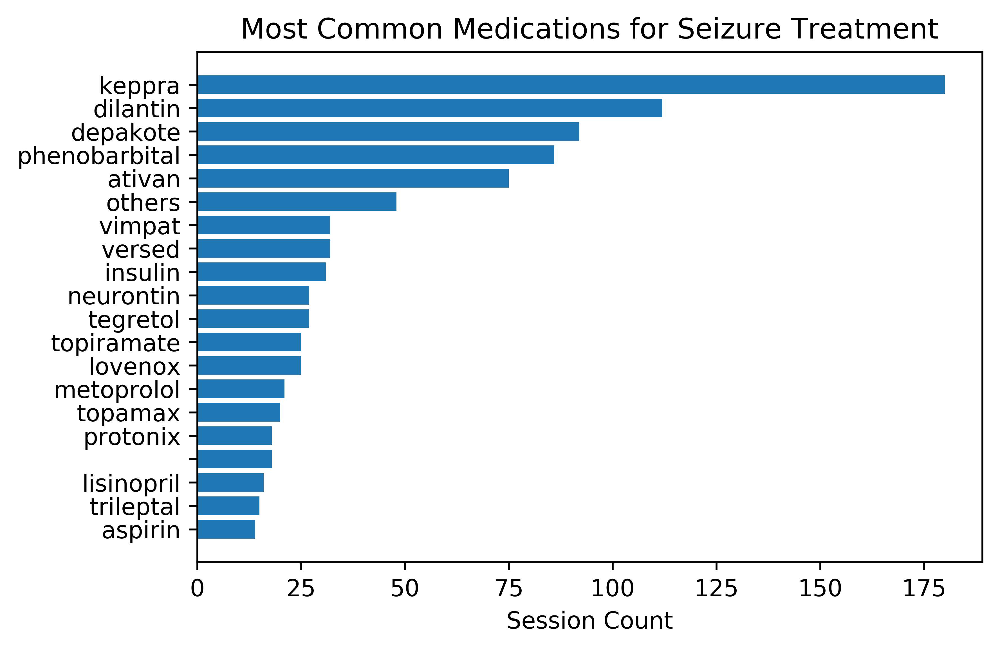

In [149]:
medCountTuples = c.most_common()[0:20]
# fig = plt.figure(figsize=(12,12))
plt.barh(list(reversed([medName for medName, val in medCountTuples])), list(reversed([val for medName, val in medCountTuples])))
plt.title("Most Common Medications for Seizure Treatment")
plt.xlabel("Session Count")

In [153]:
import sklearn.feature_extraction.text

In [250]:
tfidf_obj = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.2, min_df=0.1)

In [251]:
tfidf_obj = tfidf_obj.fit(listOfDesc)
len(tfidf_obj.vocabulary_)

28

568

In [252]:
transformed_matrix = tfidf_obj.transform(tfidf_obj.vocabulary_)

In [240]:
from sklearn.decomposition import PCA, FastICA

In [253]:
pca = PCA().fit(transformed_matrix.todense())

In [254]:
pca.explained_variance_ratio_[0:10]

array([0.03703704, 0.03703704, 0.03703704, 0.03703704, 0.03703704,
       0.03703704, 0.03703704, 0.03703704, 0.03703704, 0.03703704])

In [186]:
tfidf_obj.stop_words_

{'acom',
 'mixed',
 'spontaneous',
 'chair',
 '___',
 'dropping',
 'simple',
 'unable',
 'lowvoltage',
 'cell',
 'f4',
 'zonisamide',
 'freeuntil',
 'sedation',
 'alphaactivity',
 '30year',
 'nonepileptic',
 'major',
 'bactrim',
 'seizing',
 'overriding',
 '64',
 'residual',
 'dependence',
 'rightcarotid',
 'tirda',
 'followshyperventilation',
 'lady',
 'pleds',
 '45',
 'cerebellar',
 'pronounced',
 'falling',
 'prominence',
 'resulting',
 'beginning',
 'radiotherapy',
 'notable',
 '1998',
 'paroxysmal',
 'mentally',
 'sometimes',
 'sclerosis',
 'poorap',
 'impaired',
 'transitions',
 'butweak',
 'vertexwaves',
 'discharged',
 'semiology',
 'transient',
 'postprocedure',
 'what',
 'xr',
 '1he',
 'pregnant',
 'pattern',
 'when',
 'q12h',
 'blinking',
 'pe',
 'syncopalepisode',
 'leg',
 'preserved',
 'somewhat',
 'ongoing',
 'lift',
 'andk',
 'stomach',
 'kno',
 'zns',
 'extracranial',
 'digital',
 'nosewiping',
 'told',
 'inamplitude',
 'bitter',
 '17',
 'transients',
 '100mg',
 'bleed'